In [1]:
import sys

sys.path.append("/hpc/home/ps325/projects/velorama/velorama")

import gaston_dynamics as gd
import scanpy as sc
import numpy as np 
import pandas as pd


In [2]:
import os
from collections import defaultdict
import pandas as pd
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from glmpca import glmpca
from itertools import combinations
import torch

import sys
from importlib import reload

sys.path.append("/hpc/home/ps325/projects/gaston-velorama/src/gaston-base")

import gaston


import seaborn as sns
import math

In [3]:
from gaston import neural_net,cluster_plotting, dp_related, segmented_fit
from gaston import binning_and_plotting, isodepth_scaling, run_slurm_scripts
from gaston import spatial_gene_classification, plot_cell_types, filter_genes, process_NN_output

In [4]:
CDATADIR = "gaston-base/gaston/docs/notebooks/tutorials/"
counts_mat=np.load(CDATADIR + 'cerebellum_data/cerebellum_counts_mat.npy') # N x G UMI count array
coords_mat=np.load(CDATADIR + 'cerebellum_data/cerebellum_coords_mat.npy') # N x 2 spatial coordinate matrix
gene_labels=np.load(CDATADIR + 'cerebellum_data/cerebellum_gene_labels.npy', allow_pickle=True) # list of names for G genes
print(counts_mat.shape)

(9985, 23096)


In [5]:


# Now you can access these variables using gaston_isodepth_layers[l], coords_mats[l], counts_mats[l] for l in 0, 1, 2, 3

In [6]:
A=np.load(CDATADIR + 'cerebellum_data/F_glmpca_penalty_10_rep1.npy') # GLM-PCA results used in manuscript
S=coords_mat

# z-score normalize S and A
S_torch, A_torch = neural_net.load_rescale_input_data(S,A)

In [7]:
# gaston_model, A, S = gd.gaston_model('tutorial_outputs', S_torch, A_torch)
gaston_model, A, S= process_NN_output.process_files(CDATADIR + 'cerebellum_data/reproduce_cerebellum')


best model: gaston-base/gaston/docs/notebooks/tutorials/cerebellum_data/reproduce_cerebellum/seed19


In [8]:
CDATADIR = "gaston-base/gaston/docs/notebooks/tutorials/"

In [9]:
cell_type_mod_df = gd.create_cell_type_df(CDATADIR + 'cerebellum_data/cell_type_df.csv')

In [10]:
from importlib import reload
reload(gd)

<module 'gaston_dynamics' from '/hpc/home/ps325/projects/velorama/velorama/gaston_dynamics.py'>

In [11]:
gaston_isodepth, gaston_labels = gd.calculate_isodepth(gaston_model, A, S, coords_mat, num_layers=4,
    scale_factor=64/100, flip=True, adjust = True)

In [15]:
print(len(gaston_isodepth), len(gene_labels))

9985 23096


In [38]:
import warnings
warnings.filterwarnings("ignore")
ct_list= ['Oligodendrocytes', 'Granule', 'Bergmann', 'Purkinje', 'MLI1', 'MLI2']
ct_list = []
cell_type_df=pd.read_csv(CDATADIR + 'cerebellum_data/cell_type_df.csv', index_col=0)
pw_fit_dict, binning_output = gd.binning_output(counts_mat, gene_labels, gaston_labels, gaston_isodepth, cell_type_df, ct_list, num_bins_per_domain=[20,40,20,20])

Poisson regression for ALL cell types


100%|██████████| 2193/2193 [00:28<00:00, 75.99it/s]


In [34]:
print(gaston_isodepth)

[393.80597 224.34317 144.49994 ... 216.19861 172.06009 253.3631 ]
             Cell_Type
0             Bergmann
1             Bergmann
2           Fibroblast
3                 MLI2
4              Granule
...                ...
9980  Oligodendrocytes
9981          Bergmann
9982           Granule
9983        Astrocytes
9984           Granule

[9985 rows x 1 columns]


(9985, 23096)
Graph construction completed in 0.0597 seconds


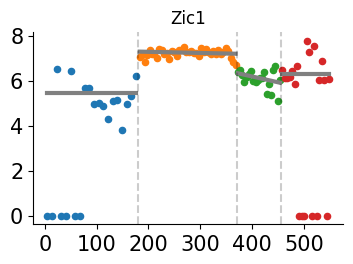

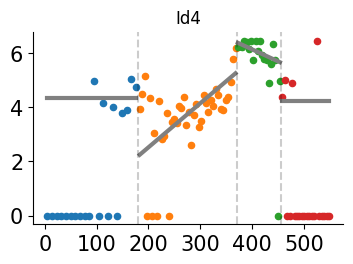

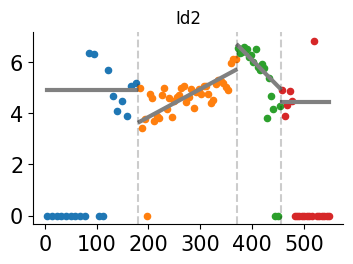

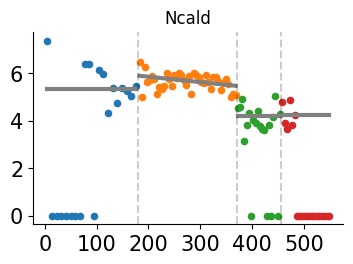

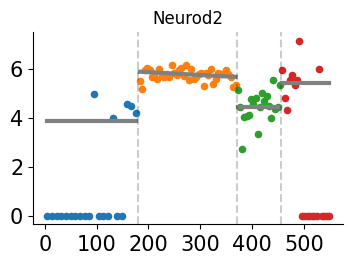

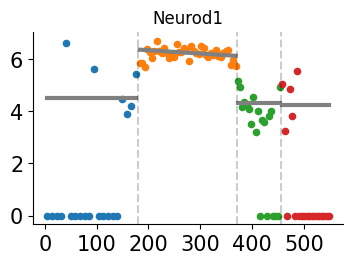

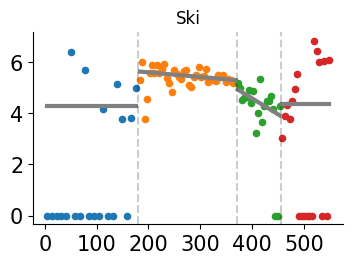

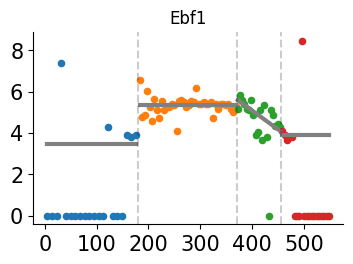

In [40]:
df = pd.DataFrame(counts_mat, columns=gene_labels)
adata=sc.AnnData(df)
adata.obsm["coords"] = coords_mat
print(adata.shape)
dag_adjacency_matrix = gd.construct_dag(adata, gaston_isodepth, coords_mat, n_neighbors=7, plot=False)
gd.create_tf_targets(adata, pw_fit_dict, binning_output, q=0.8, file = 'transcription_factors.txt')
# adata.write('/hpc/home/ps325/projects/velorama/datasets/gaston_dynamics_test_mod_q8_flip.h5ad')


gene_name = ["Zic1", "Id4", "Id2", "Ncald", "Neurod2", "Neurod1", "Ski", "Ebf1"]

for gene in gene_name:
    binning_and_plotting.plot_gene_pwlinear(gene, pw_fit_dict, gaston_labels, gaston_isodepth, 
                                            binning_output, cell_type_list=None, pt_size=20, colors=None, 
                                            linear_fit=True, ticksize=15, figsize=(4,2.5), offset=10**6, lw=3,
                                           domain_boundary_plotting=True)
    plt.title(f"{gene}")


In [19]:
l = np.array(adata.var.index.tolist())
l[adata.var.is_target]
l[adata.var.is_reg]

array(['Adarb1', 'Bcl6', 'Celf4', 'Chd2', 'Ckmt1', 'Ctcf', 'Cux1',
       'Cxxc5', 'Dnmt3a', 'Dusp26', 'Ebf1', 'Eef1d', 'En2', 'Eno1',
       'Etfb', 'Etv1', 'Fez1', 'Foxn3', 'Foxo3', 'Git2', 'Gpd1', 'Gtf2i',
       'Hdac8', 'Hivep2', 'Hspa5', 'Id2', 'Id4', 'Klf13', 'Klf7', 'Luzp1',
       'Luzp2', 'Mbnl2', 'Meis1', 'Mllt10', 'Msi2', 'Msra', 'Mxd4',
       'Ncald', 'Ncoa1', 'Neurod1', 'Neurod2', 'Nfic', 'Nr1d1', 'Nr1d2',
       'Phf20', 'Prnp', 'Pura', 'Rab18', 'Rad21', 'Rora', 'Rufy3',
       'Setbp1', 'Sfpq', 'Ski', 'Smap2', 'Smarca4', 'Smarcc2', 'Snrnp70',
       'Srrm3', 'Ssbp3', 'Stat2', 'Tceal3', 'Tceal5', 'Tcf4', 'Tppp',
       'Trove2', 'Tsnax', 'Ubxn1', 'Uqcrb', 'Ywhae', 'Zbtb18', 'Zbtb20',
       'Zbtb4', 'Zeb2', 'Zfp467', 'Zfp521', 'Zic1', 'Zmiz1'], dtype='<U14')

In [ ]:
for l in range(3):  # range(4) will iterate over 0, 1, 2, 3
    gaston_isodepth_l=gaston_isodepth[(gaston_labels == l) | (gaston_labels == l + 1)]
    coords_mat_l = coords_mat[(gaston_labels == l) | (gaston_labels == l + 1), :]
    counts_mat_l=counts_mat[(gaston_labels == l) | (gaston_labels == l + 1), :]
    df = pd.DataFrame(counts_mat_l, columns=gene_labels)
    adata=sc.AnnData(df)
    adata.obsm["coords"] = coords_mat_l
    print(adata.shape)
    dag_adjacency_matrix = gd.construct_dag(adata, gaston_isodepth_l, coords_mat_l, n_neighbors=7, plot=False)
    gd.plot_spatial_dag(dag_adjacency_matrix, coords_mat_l, gaston_isodepth_l)
    
    gd.create_tf_targets(adata, pw_fit_dict, binning_output, q=0.7, file = 'transcription_factors.txt')
    
    # l = 2 - l
    print(f"layer {l}")
    
    adata.write(f'/hpc/home/ps325/projects/velorama/datasets/cerebellum_consc-layers_{l}_mod.h5ad')

AnnData object with n_obs × n_vars = 3330 × 23096
    obsm: 'coords'
Graph construction completed in 0.0176 seconds


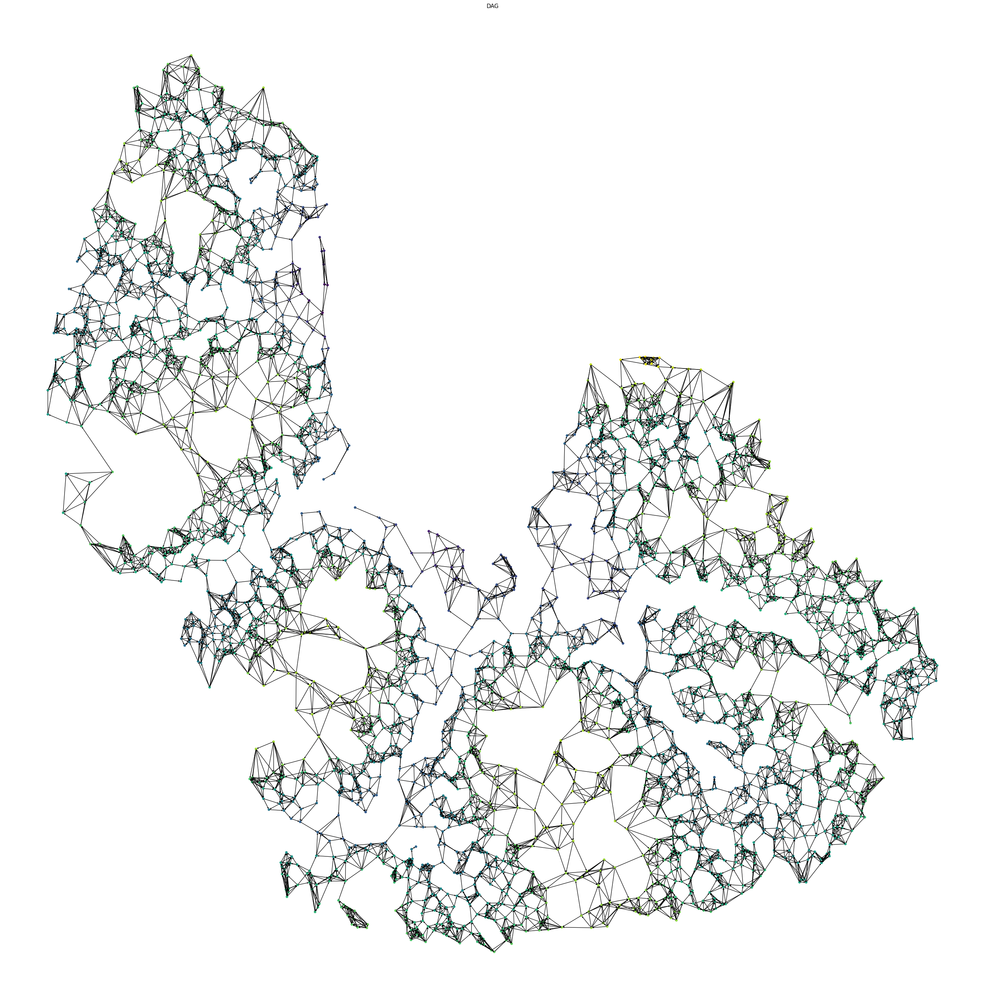

AnnData object with n_obs × n_vars = 3329 × 23096
    obsm: 'coords'
Graph construction completed in 0.0174 seconds


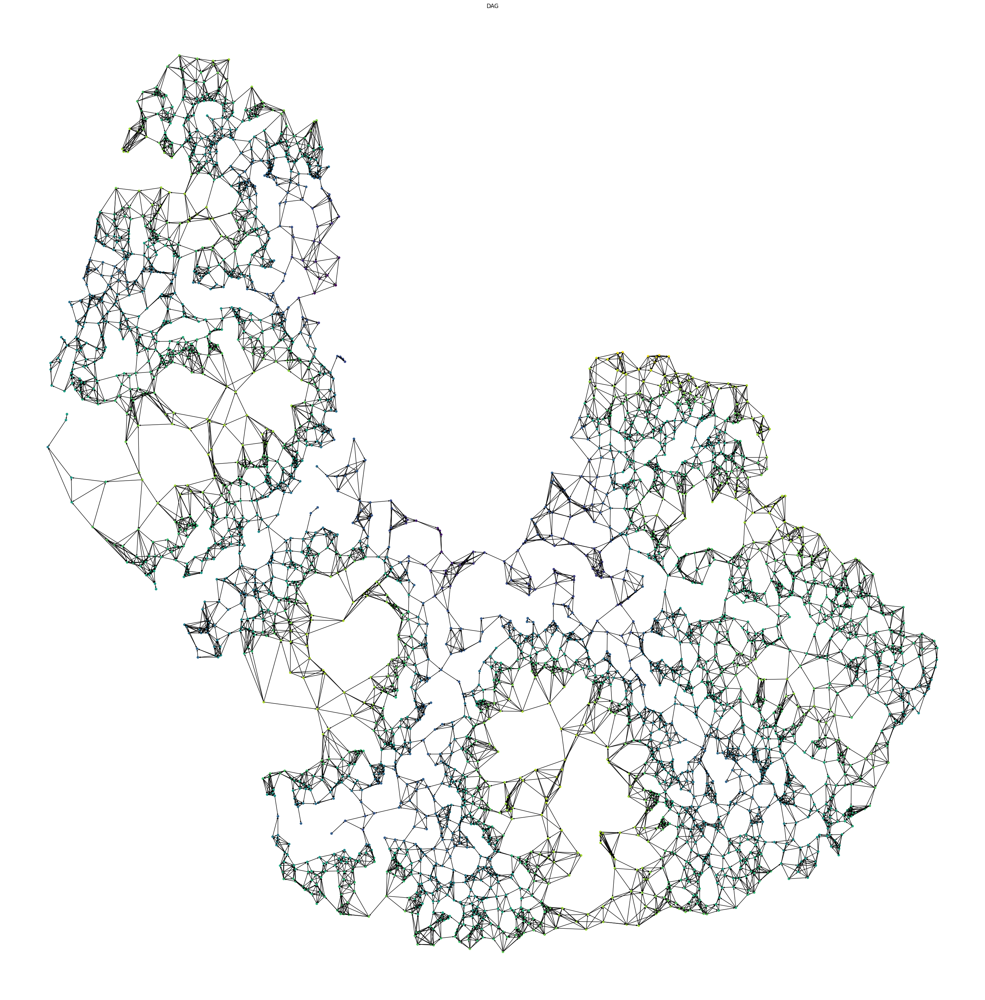

AnnData object with n_obs × n_vars = 3326 × 23096
    obsm: 'coords'
Graph construction completed in 0.0179 seconds


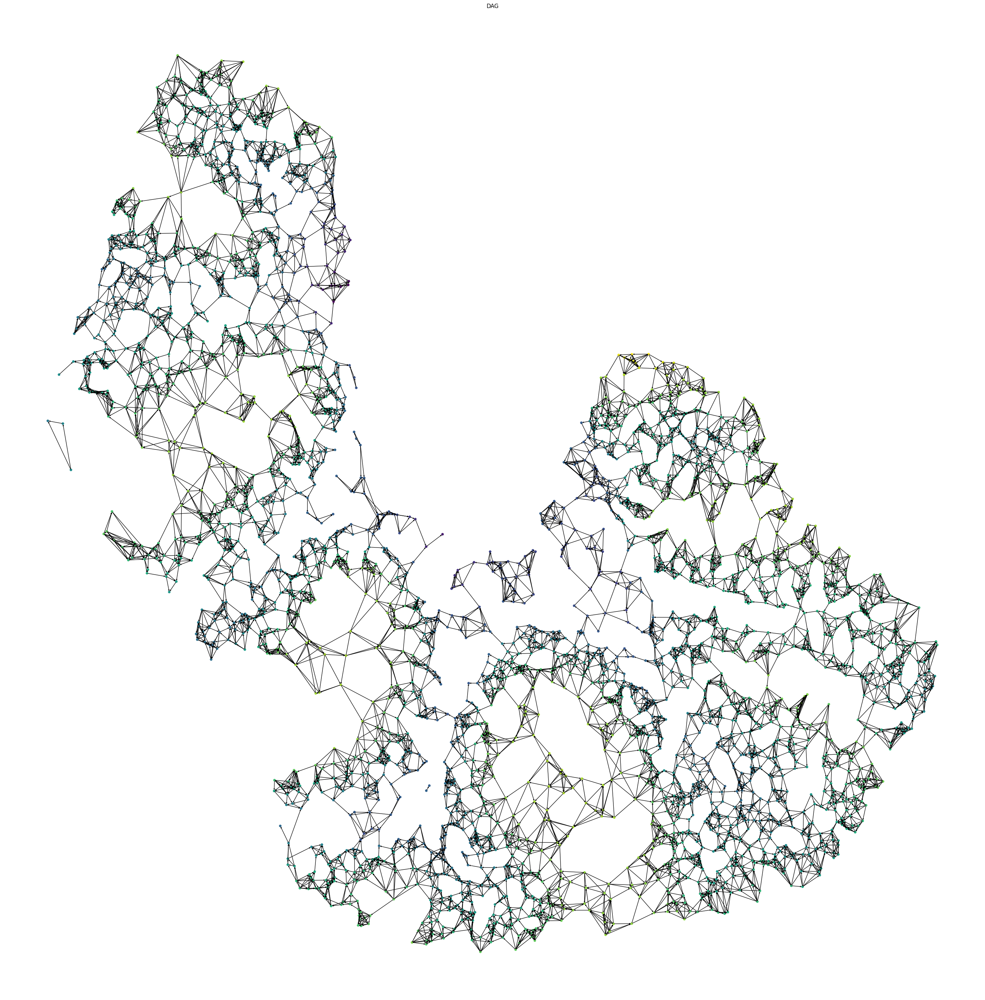

In [16]:
import pandas as pd
import scanpy as sc
import numpy as np

def split_and_combine(gaston_labels, gaston_isodepth, coords_mat, counts_mat, gene_labels, seed = None):
    if seed is not None:
        np.random.seed(seed)  # Setting the seed for reproducibility
        
    combined_data = {'A': [], 'B': [], 'C': []}
    gaston_isodepth_parts = {'A': [], 'B': [], 'C': []}
    coords_mat_parts = {'A': [], 'B': [], 'C': []}
    
    for l in range(4):  # Iterating over each layer
        layer_indices = np.where(gaston_labels == l)[0]
        np.random.shuffle(layer_indices)
        
        # Splitting into three equal parts
        split_indices = np.array_split(layer_indices, 3)
        
        for part, key in zip(split_indices, ['A', 'B', 'C']):
            gaston_isodepth_l = gaston_isodepth[part]
            coords_mat_l = coords_mat[part, :]
            counts_mat_l = counts_mat[part, :]
            
            gaston_isodepth_parts[key].append(gaston_isodepth_l)
            coords_mat_parts[key].append(coords_mat_l)
            
            df = pd.DataFrame(counts_mat_l, columns=gene_labels)
            adata = sc.AnnData(df)
            adata.obsm["coords"] = coords_mat_l
            
            combined_data[key].append(adata)
    
    # Combine parts from each layer and save with respective suffix
    for key in combined_data.keys():
        combined_adata = sc.concat(combined_data[key])
        print(combined_adata)
        combined_isodepth = np.concatenate(gaston_isodepth_parts[key])
        combined_coords = np.vstack(coords_mat_parts[key])
        
        dag_adjacency_matrix = gd.construct_dag(combined_adata, combined_isodepth, combined_coords, n_neighbors=7, plot=False)
        gd.plot_spatial_dag(dag_adjacency_matrix, combined_coords, combined_isodepth)
        gd.create_tf_targets(combined_adata, pw_fit_dict, binning_output, q=0.8, file = 'transcription_factors.txt')
        combined_adata.write(f'/hpc/home/ps325/projects/velorama/datasets/cerebellum_{key}_mod_q8_flip.h5ad')

# Example usage (assuming you have the required input data):
split_and_combine(gaston_labels, gaston_isodepth, coords_mat, counts_mat, gene_labels, seed = 42)


In [ ]:
import warnings
warnings.filterwarnings("ignore")

#ct_list= ['Oligodendrocytes', 'Granule', 'Bergmann', 'Purkinje', 'MLI1', 'MLI2']
ct_list=[]
cell_type_df=pd.read_csv(CDATADIR + 'cerebellum_data/cell_type_df.csv', index_col=0)

pw_fit_dict, binning_output = gd.binning_output(counts_mat, gene_labels, gaston_labels, gaston_isodepth, cell_type_df, ct_list)

In [ ]:
pw_fit_dict['all_cell_types'][0].shape

In [ ]:
binning_output['gene_labels_idx'].shape

In [ ]:
q=0.9 
file = 'transcription_factors.txt'

targets = gd.target_list(pw_fit_dict, binning_output)
reg_set = gd.reg_list(file, pw_fit_dict, binning_output, q)

In [ ]:
df = pd.DataFrame(counts_mat, columns=gene_labels)
adata=sc.AnnData(df)
adata.obsm["coords"] = coords_mat
print(adata.shape)
dag_adjacency_matrix = gd.construct_dag(adata, gaston_isodepth, coords_mat, n_neighbors=7, plot=False)
#gd.plot_spatial_dag(dag_adjacency_matrix, coords_mat, gaston_isodepth)

gd.is_target(adata, targets)
gd.is_reg(adata, reg_set)

print(adata.var)

In [ ]:
l = np.array(adata.var.index.tolist())
l[adata.var.is_target]
l[adata.var.is_reg]

In [ ]:
#adata.write('/hpc/home/ps325/projects/velorama/datasets/gaston_dynamics_test_flip.h5ad')

In [ ]:
def is_nan_like(x):
    return x is None or x != x or x == ''

dag_nan =  np.isnan(dag_adjacency_matrix).sum()
counts_nan =  np.isnan(counts_mat).sum()
coords_nan =  np.isnan(coords_mat).sum()
labels_nan = np.sum([is_nan_like(x) for x in gene_labels])

print(dag_nan, counts_nan, coords_nan, labels_nan)

In [ ]:
import numpy as np
import pandas as pd
import anndata as ad  # assuming you are working with AnnData objects

def convert_doubles_to_floats(data):
    # Check for NaN values and convert data types
    if isinstance(data, np.ndarray):
        nan_count = np.isnan(data).sum()
        if data.dtype == 'float64':
            data = data.astype('float32')
    elif isinstance(data, pd.DataFrame):
        nan_count = data.isna().sum().sum()
        data = data.astype('float32')
    else:
        nan_count = 0
    
    return data, nan_count

def convert_adata_to_float(adata):
    total_nan_count = 0
    
    for key in adata.uns:
        adata.uns[key], nan_count = convert_doubles_to_floats(adata.uns[key])
        total_nan_count += nan_count
    
    for key in adata.obs:
        adata.obs[key], nan_count = convert_doubles_to_floats(adata.obs[key])
        total_nan_count += nan_count
    
    for key in adata.var:
        adata.var[key], nan_count = convert_doubles_to_floats(adata.var[key])
        total_nan_count += nan_count
    
    for key in adata.obsm:
        adata.obsm[key], nan_count = convert_doubles_to_floats(adata.obsm[key])
        total_nan_count += nan_count
    
    for key in adata.varm:
        adata.varm[key], nan_count = convert_doubles_to_floats(adata.varm[key])
        total_nan_count += nan_count
    
    for key in adata.layers:
        adata.layers[key], nan_count = convert_doubles_to_floats(adata.layers[key])
        total_nan_count += nan_count
    
    # Convert the main X matrix if it's a numpy array
    if isinstance(adata.X, np.ndarray):
        nan_count = np.isnan(adata.X).sum()
        if adata.X.dtype == 'float64':
            adata.X = adata.X.astype('float32')
        total_nan_count += nan_count
    elif isinstance(adata.X, pd.DataFrame):
        nan_count = adata.X.isna().sum().sum()
        adata.X = adata.X.astype('float32')
        total_nan_count += nan_count
    
    print(f"Total NaN count: {total_nan_count}")
    return adata


In [ ]:
markers = ['sox8', 'tmem125', 'creb5', 'klk6', 'nipal4', 'st18', 'tmem63a', 'klhl2', 'itpr2', 'gjb1', 'eml1', 'olig2', 'enpp2', 'sec14l5', 'pou3f1', 'gpr37', 'bace1', 'plekhh1', 'fasn', 'mobp', 'ephb1', 'ppfibp1', 'vldlr', 'gjc3', 'anln', 'tf', 'adamts4', 's1pr5', 'ermn', 'fgfr2', 'kif6', 'dbndd2', 'ninj2', 'npc1', 'mag', 'fa2h', 'pnpla2', 'slc25a19', 'tmem88b', 'cldn11', 'sgk3', 'tyro3', 'il33', 'mog', 'hapln2', 'sgk2', 'pllp', 'sox10', 'gamt', 'prkcz', 'mcam', 'elovl7', 'plp1', 'arsg', 'hdac11', 'galc', 'cntf', 'sp7', 'tspan15', 'opalin', 'pex5l', 'kif13b', 'gjc2', 'enpp6', 'omg', 'aspa', 'pde8a', 'slc25a29', 'hepacam', 'olig1', 'cldn14', 'olig3', 'mbp', 'myo1d', 'efnb3', 'tmem163', 'zdhhc9', 'itgb4', 'sema4d', 'bcas1', 'myrf', 'slc25a38', 'nkx6-2', 'ddc', 'ptgds', 'dpy19l1', 'arrdc2', 'gpr62', 'nfe2l3', 'dusp15', 'col27a1', 'camk2d', 'kcnj9', 'slc38a3', 'loxl2', 'grik2', 'slc17a7', 'zfp521', 'schip1', 'serpinb1c', 'il16', 'sez6', 'chd7', 'cldn1', 'neurod1', 'wwc1', 'lypd1', 'per1', 'egr1', 'slc8a2', 'grm4', 'sall3', 'axin2', 'loc214238', 'scube1', 'etv1', 'pax6', 'fos', 'car10', '6330403a02rik', 'megf11', 'doc2g', 'mical2', 'sgtb', 'slc8a3', 'crhr1', 'apba1', 'ptchd1', 'gabra6', 'st8sia5', 'lhfp', 'mb21d2', 'vsnl1', 'ankrd50', 'syne1', 'dusp5', 'rgs6', 'slc2a6', 'pex5l', 'ufsp1', 'fut8', 'tiam1', 'lrp1b', 'zmat4', 'tesc', 'zfp385b', 'e330009j07rik', 'btbd3', 'btg1', 'cst3', 'sox2', 'hpca', 'slc24a3', 'sctr', 'cbln1', 'dbi', 'kcnk9', 'ppp1r17', 'id2', 'prkca', 'hgf', 'dmd', 'atp2a2', 'mfn1', 'pde1b', 'prkcg', 'ryr1', 'grik1', 'omp', 'slc1a6', '0610007p14rik', 'dlg4', 'fmr1', 'pcp4', 'gad2', 'sbk1', 'hcn1', 'cpne2', 'pde1a', 'slc12a5', 'shisa8', 'pcsk6', 'gad1', 'cd59', 'shank2', 'gabbr2', 'prkg1', 'steap2', 'cplx1', 'setd7', 'nes', 'penk', 'itgav', 'itpr1', 'loc270764', 'gng4', 'hspb1', 'dlgap1', 'mrps35', 'shh', 'gng13', 'arhgap26', 'pde9a', 'itga3', 'tex261', 'slc22a15', 'th', 'sox9', 'ppap2b', 'tshz1', 'sox1', 'gria3', 'sptbn2', 'ankrd1', 'grm1', 'myo10', 'atxn1', 'bean1', 'kcnc3', 'grid2', 'cacna1g', 'kcnma1', 'cacna2d2', 'abat', 'erp29', 'gm1399', 'cacna1a', 'kcnk3', 'pvalb', 'hapln4', 'lrrn2', 'tm6sf1', 'dpp6', 'scn5a', 'hivep2', 'gpsm1', 'plcb4', 'opa1', 'ctsl', 'inpp5a', 'grid2ip', 'nefh', 'ptpn4', 'trpm4', 'atm', 'slc35b1', 'bai3', 'gabra1', 'bcl2', 'faim2', 'lrp8', 'lancl1', 'itpr3', 'tsc2', 'nfasc', 'grin1', 'pde5a', 'cd3g', 'pkp4', 'kcna2', 'calb1', 'psen1', 'aldoc', 'baiap2', 'dgkh', 'cntnap2', 'atxn1l', 'slc24a2', 'syt2', 'creg1', 'dedd', 'ppm1e', 'trpc3', 'slc32a1', 'cerk', 'plat', 'nrip3', 'tbp', 'cds1', 'cacng2', 'reln', 'pcp4l1', 'nkain4', 'nell2', 'tnfrsf21', 'ascl1', 'synpr', 'car8', 'pcbp3', 'sct', 'hpcal1', 'atp2b2', 'aifm1', 'top1', 'dpp10', 'adgrb1', 'clmn', 'fam107b', 'clstn3', 'cdr2', 'rgs8', 'hdac6', 'camk2a', 'abhd3', 'cnpy1', 'nrxn3', 'slc1a2', 'metrn', 'hepacam', 'p2rx7', 'grin2b', 'ttc21b', 'gdf10', 'kif1bp', 'a2m', 'slc4a4', 'gpr37l1', 'ptch1', 'vim', 'p2ry1', 'gria4', 'zeb2', 'sept4', 'grm3', 'ufl1', 'egfr', 'btbd17', 'dao', 'itih3', 'fabp7', 's100b', 'ntsr2', 'bicd2', 'gria1', 'itgb1', 'slc1a3', 'grin3a', 'acsbg1', 'aqp4', 'aldh1l1', 'gfap', 'atp7a', 'gja1', 'gjb6', 'hopx', 'cdc42ep4','nxph1', 'ptprk', 'sorcs3', 'prkcd', 'cdh22']
tf = lowercased_array = list(map(str.lower, l[adata.var.is_reg]))


In [ ]:
intersection = np.intersect1d(markers, tf)
print(len(tf))
print(intersection)

In [ ]:
import timeit

array = ["Hello", "WORLD", "PyThOn"] * 10000  # Increase size for better measurement

# List comprehension
time_list_comp = timeit.timeit('[item.lower() for item in array]', globals=globals(), number=1000)

# Map function
time_map = timeit.timeit('list(map(str.lower, array))', globals=globals(), number=1000)

# Loop
setup_loop = """
lowercased_array = []
for item in array:
    lowercased_array.append(item.lower())
"""
time_loop = timeit.timeit(setup_loop, globals=globals(), number=1000)

print(f"List comprehension: {time_list_comp:.6f} seconds")
print(f"Map function: {time_map:.6f} seconds")
print(f"Loop: {time_loop:.6f} seconds")
